# Logistic Regression for classification

In [86]:
# Downlaoding the dataset for classification
!pip install opendatasets

In [87]:
import opendatasets as od
dataSetUrl = "https://www.kaggle.com/datasets/jsphyg/weather-dataset-rattle-package"
od.download(dataSetUrl)
# from urllib.request import urlretrieve
# urlretrieve(dataSetUrl, "weatherAUS.csv")

Skipping, found downloaded files in ".\weather-dataset-rattle-package" (use force=True to force download)


In [88]:
import os
import pandas as pd
import numpy as np

In [89]:
#Opening and creating the full path for csv file
data_dir = ("./weather-dataset-rattle-package")
os.listdir(data_dir)

['weatherAUS.csv']

In [90]:
train_csv = data_dir + "/weatherAUS.csv"
train_csv

'./weather-dataset-rattle-package/weatherAUS.csv'

In [91]:
raw_df = pd.read_csv(train_csv)
raw_df.sample(10)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
41354,2014-03-21,Williamtown,19.0,25.3,NaN,NaN,NaN,NNE,33.0,NaN,...,91.0,70.0,1022.4,1019.6,7.0,1.0,21.0,24.3,NaN,NaN
29572,2015-10-31,Richmond,11.6,25.8,0.0,4.0,NaN,N,30.0,W,...,77.0,52.0,1022.0,1017.9,5.0,6.0,17.7,24.0,No,No
4246,2012-05-21,BadgerysCreek,6.1,19.9,0.0,NaN,NaN,N,19.0,NaN,...,100.0,56.0,1025.8,1021.4,NaN,NaN,10.3,19.3,No,No
55732,2010-08-23,Ballarat,2.1,11.0,0.0,NaN,NaN,NNW,50.0,N,...,77.0,69.0,1014.0,1011.0,3.0,8.0,6.6,9.1,No,Yes
49351,2009-10-25,Tuggeranong,7.3,19.0,0.0,NaN,NaN,S,52.0,W,...,67.0,57.0,1016.5,1013.8,NaN,NaN,13.6,17.3,No,Yes
8858,2016-12-08,Cobar,18.0,37.0,0.2,8.6,NaN,W,87.0,NNW,...,NaN,NaN,1005.5,1000.1,NaN,NaN,27.8,35.2,No,Yes
125785,2014-08-14,SalmonGums,2.5,18.9,0.0,NaN,NaN,N,44.0,N,...,55.0,25.0,NaN,NaN,NaN,NaN,11.5,17.5,No,No
50993,2014-07-23,Tuggeranong,-1.4,13.5,0.0,NaN,NaN,N,19.0,NaN,...,79.0,57.0,1026.7,1022.1,NaN,NaN,2.9,12.6,No,No
19442,2012-09-19,NorahHead,12.4,19.7,10.0,NaN,NaN,WNW,26.0,S,...,69.0,67.0,1016.1,1014.3,NaN,NaN,17.0,18.1,Yes,No
73391,2017-06-15,Mildura,6.2,18.6,0.0,6.6,4.3,ESE,15.0,NE,...,91.0,50.0,1027.9,1025.4,8.0,7.0,8.9,17.4,No,No


In [92]:
#Quick look of the raw data:
raw_df.info()

<class 'pandas.DataFrame'>
RangeIndex: 145460 entries, 0 to 145459
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           145460 non-null  str    
 1   Location       145460 non-null  str    
 2   MinTemp        143975 non-null  float64
 3   MaxTemp        144199 non-null  float64
 4   Rainfall       142199 non-null  float64
 5   Evaporation    82670 non-null   float64
 6   Sunshine       75625 non-null   float64
 7   WindGustDir    135134 non-null  str    
 8   WindGustSpeed  135197 non-null  float64
 9   WindDir9am     134894 non-null  str    
 10  WindDir3pm     141232 non-null  str    
 11  WindSpeed9am   143693 non-null  float64
 12  WindSpeed3pm   142398 non-null  float64
 13  Humidity9am    142806 non-null  float64
 14  Humidity3pm    140953 non-null  float64
 15  Pressure9am    130395 non-null  float64
 16  Pressure3pm    130432 non-null  float64
 17  Cloud9am       89572 non-null   float64


In [93]:
#From quick look of the df, we can see that we have null values on RainToday and RainTomorrow which are the columns
#we gonna calssify into, and if the columns are null our model can't get enough information, So I am going the drop the
#columns where RainToday and RainTommorrow are null
raw_df.dropna(subset=["RainToday","RainTomorrow"],inplace=True) 

In [94]:
raw_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145454,2017-06-20,Uluru,3.5,21.8,0.0,NaN,NaN,E,31.0,ESE,...,59.0,27.0,1024.7,1021.2,NaN,NaN,9.4,20.9,No,No
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No


In [95]:
#EDA
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
%matplotlib inline

In [96]:
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (11,7)
matplotlib.rcParams['figure.facecolor']= '#00000000'

In [97]:
px.histogram(raw_df, x="Location", title="Location vs  Rainy days",) #color = "RainToday")

In [98]:
px.histogram(raw_df, x="Temp3pm", title="RainToday vs Temperature at 3pm")

In [99]:
px.histogram(raw_df, x="RainToday", title ="RainToday") #color="RainTomorrow")

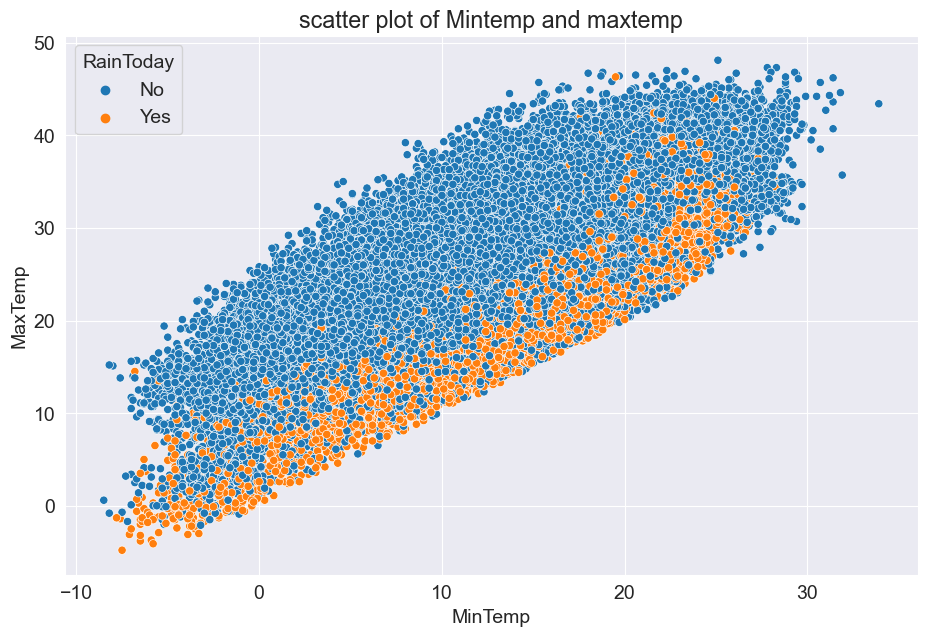

In [100]:
sns.scatterplot(x="MinTemp",y="MaxTemp",hue="RainToday",data=raw_df);
plt.title("scatter plot of Mintemp and maxtemp");

In [101]:
px.scatter(raw_df,x='Temp3pm',y='Humidity3pm',title="Sactter plort of temperature and humidity at 3pm",)

In [102]:
raw_df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='str')

In [103]:
#Diving our data into Train, Validation and Test:
# from sklearn.model_selection import train_test_split
# train_val_df, test_df = train_test_split(raw_df, test_size=0.2, random_state=42)
# train_df, val_df = train_test_split(train_val_df, test_size=0.25, random_state=42)

In [104]:
# print("The size of training data set is",train_df.shape)
# print("The size of test data set is ",test_df.shape)
# print("The size of validation data set is",val_df.shape)

In [105]:
# print(train_df.columns)
# print(test_df.columns)
# print(val_df.columns)

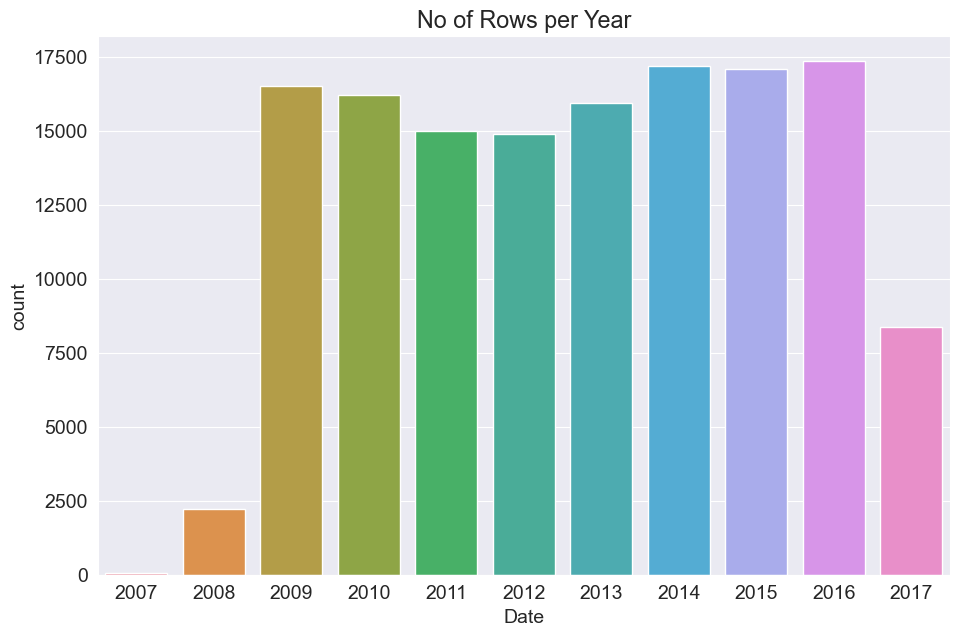

In [106]:
#Using seaborn countplot to see how much data each year has got
plt.title("No of Rows per Year")
sns.countplot(x = pd.to_datetime(raw_df.Date).dt.year);

In [107]:
#We are currently working with time series data
#So what I am gonna do is I am gonna use the data before 2015 for test
#data of 2015 as validation and
#data from 2016 as test set
year = pd.to_datetime(raw_df.Date).dt.year #converting year in pandas datetime year
train_df = raw_df[year<2015] #Allocating data before 2015 for training
val_df = raw_df[year==2015] #Allocating data of 2015 for validation
test_df = raw_df[year>2015]#Allocating data after 2015 for test

In [108]:
print("The shape of training data is:",train_df.shape)
print("The shape of validation data is:", val_df.shape)
print("The shape of test data is: ", test_df.shape)

The shape of training data is: (97988, 23)
The shape of validation data is: (17089, 23)
The shape of test data is:  (25710, 23)


In [109]:
train_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
144548,2014-12-27,Uluru,16.9,33.2,0.0,NaN,NaN,SSE,43.0,ESE,...,22.0,13.0,1014.1,1009.8,NaN,NaN,23.7,31.8,No,No
144549,2014-12-28,Uluru,15.1,36.8,0.0,NaN,NaN,NE,31.0,ENE,...,16.0,8.0,1012.6,1007.6,NaN,NaN,28.9,34.8,No,No
144550,2014-12-29,Uluru,17.3,37.8,0.0,NaN,NaN,ESE,39.0,ESE,...,15.0,8.0,1011.9,1008.0,NaN,NaN,29.7,35.7,No,No
144551,2014-12-30,Uluru,20.1,38.5,0.0,NaN,NaN,ESE,43.0,ESE,...,22.0,9.0,1014.0,1009.2,NaN,NaN,29.8,37.2,No,No


In [110]:
#splitting our input and target columns
input_cols = list(train_df)[1:-1]
target_cols = "RainTomorrow"
print(input_cols)
print(target_cols)

['Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainToday']
RainTomorrow


In [111]:
#train
train_inputs = train_df[input_cols].copy()
train_target = train_df[target_cols].copy()
#validation
val_inputs = val_df[input_cols].copy()
val_target = val_df[target_cols].copy()
#test
test_inputs = test_df[input_cols].copy()
test_target = test_df[target_cols].copy()

In [112]:
#Finding numeric and categorical data
numeric_cols = train_inputs.select_dtypes(include=np.number).columns.tolist()
categorical_cols = train_inputs.select_dtypes("object").columns.tolist()


C:\Users\demo\AppData\Local\Temp\ipykernel_10492\19572041.py:3: Pandas4Warning:

For backward compatibility, 'str' dtypes are included by select_dtypes when 'object' dtype is specified. This behavior is deprecated and will be removed in a future version. Explicitly pass 'str' to `include` to select them, or to `exclude` to remove them and silence this warning.
See https://pandas.pydata.org/docs/user_guide/migration-3-strings.html#string-migration-select-dtypes for details on how to write code that works with pandas 2 and 3.



In [113]:
#Checking general statics for the numeric columns
train_inputs[numeric_cols].describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,97674.000000,97801.000000,97988.000000,61657.000000,57942.000000,91160.000000,97114.000000,96919.000000,96936.000000,96872.000000,88876.000000,88857.000000,63000.000000,61966.000000,97414.000000,97392.000000
mean,12.007831,23.022202,2.372935,5.289991,7.609004,40.215873,14.092263,18.764608,68.628745,51.469547,1017.513734,1015.132352,4.302952,4.410677,16.835126,21.540138
std,6.347175,6.984397,8.518819,3.952010,3.788813,13.697967,8.984203,8.872398,19.003097,20.756113,7.072510,6.997072,2.866634,2.693370,6.404586,6.831612
min,-8.500000,-4.100000,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,980.500000,979.000000,0.000000,0.000000,-5.900000,-5.100000
25%,7.500000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.800000,1010.400000,1.000000,2.000000,12.200000,16.600000
50%,11.800000,22.400000,0.000000,4.600000,8.500000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.500000,1015.100000,5.000000,5.000000,16.600000,20.900000
75%,16.600000,27.900000,0.800000,7.200000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.300000,1019.900000,7.000000,7.000000,21.400000,26.200000
max,33.900000,48.100000,371.000000,82.400000,14.300000,135.000000,87.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.100000


In [114]:
#checking number of category we have for each column
train_inputs[categorical_cols].nunique()

Location       49
WindGustDir    16
WindDir9am     16
WindDir3pm     16
RainToday       2
dtype: int64

In [115]:
#Filling Nan values with mean:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(strategy = "mean")
print(raw_df[numeric_cols].isna().sum())
print()
print(train_inputs[numeric_cols].isna().sum())

MinTemp            468
MaxTemp            307
Rainfall             0
Evaporation      59694
Sunshine         66805
WindGustSpeed     9105
WindSpeed9am      1055
WindSpeed3pm      2531
Humidity9am       1517
Humidity3pm       3501
Pressure9am      13743
Pressure3pm      13769
Cloud9am         52625
Cloud3pm         56094
Temp9am            656
Temp3pm           2624
dtype: int64

MinTemp            314
MaxTemp            187
Rainfall             0
Evaporation      36331
Sunshine         40046
WindGustSpeed     6828
WindSpeed9am       874
WindSpeed3pm      1069
Humidity9am       1052
Humidity3pm       1116
Pressure9am       9112
Pressure3pm       9131
Cloud9am         34988
Cloud3pm         36022
Temp9am            574
Temp3pm            596
dtype: int64


In [116]:
imputer.fit(raw_df[numeric_cols])
list(imputer.statistics_)

[12.18482386562048,
 23.235120301822324,
 2.349974074310839,
 5.472515506887154,
 7.630539861047281,
 39.97051988882308,
 13.990496092519967,
 18.631140782316862,
 68.82683277087672,
 51.44928834695453,
 1017.6545771543717,
 1015.2579625879797,
 4.431160817585808,
 4.499250233195188,
 16.98706638787991,
 21.69318269001107]

In [117]:
#filling train, validation and numeric cols with mean
#train
train_inputs[numeric_cols] = imputer.transform(train_inputs[numeric_cols])
#validation
val_inputs[numeric_cols] = imputer.transform(val_inputs[numeric_cols])
#Test
test_inputs[numeric_cols] = imputer.transform(test_inputs[numeric_cols])


In [118]:
print(train_inputs.isna().sum())
print()
print(val_inputs.isna().sum())
print()
print(test_inputs.isna().sum())

Location            0
MinTemp             0
MaxTemp             0
Rainfall            0
Evaporation         0
Sunshine            0
WindGustDir      6868
WindGustSpeed       0
WindDir9am       7019
WindDir3pm       1952
WindSpeed9am        0
WindSpeed3pm        0
Humidity9am         0
Humidity3pm         0
Pressure9am         0
Pressure3pm         0
Cloud9am            0
Cloud3pm            0
Temp9am             0
Temp3pm             0
RainToday           0
dtype: int64

Location            0
MinTemp             0
MaxTemp             0
Rainfall            0
Evaporation         0
Sunshine            0
WindGustDir       893
WindGustSpeed       0
WindDir9am       1099
WindDir3pm        511
WindSpeed9am        0
WindSpeed3pm        0
Humidity9am         0
Humidity3pm         0
Pressure9am         0
Pressure3pm         0
Cloud9am            0
Cloud3pm            0
Temp9am             0
Temp3pm             0
RainToday           0
dtype: int64

Location            0
MinTemp             0
MaxT

In [119]:
#Scaling out train, test and validation data
from sklearn.preprocessing import MinMaxScaler
#fitting data to the scaler
scaler = MinMaxScaler()
scaler.fit(raw_df[numeric_cols])
#train data
train_inputs[numeric_cols] = scaler.transform(train_inputs[numeric_cols])
#validation data
val_inputs[numeric_cols] = scaler.transform(val_inputs[numeric_cols])
#test data
test_inputs[numeric_cols] = scaler.transform(test_inputs[numeric_cols])

In [120]:
#Now our numeric columns are in the range of 0 and 1
train_inputs.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000,97988.000000
mean,0.483689,0.525947,0.006396,0.036949,0.525366,0.265107,0.108395,0.215668,0.686309,0.514693,0.612014,0.608705,0.483192,0.493693,0.507089,0.517103
std,0.149458,0.131904,0.022962,0.021628,0.200931,0.102420,0.068800,0.101424,0.189008,0.206376,0.111335,0.106611,0.255486,0.238028,0.134722,0.130726
min,0.000000,0.013233,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.030400,0.000000,0.000000,0.027426,0.005758
25%,0.377358,0.429112,0.000000,0.026207,0.517241,0.193798,0.053846,0.149425,0.570000,0.370000,0.543802,0.540800,0.333333,0.333333,0.409283,0.422265
50%,0.478774,0.514178,0.000000,0.037741,0.526244,0.255814,0.100000,0.218391,0.690000,0.520000,0.614125,0.610527,0.492351,0.499917,0.502110,0.506718
75%,0.591981,0.618147,0.002156,0.038621,0.634483,0.310078,0.146154,0.275862,0.830000,0.650000,0.682645,0.675200,0.666667,0.666667,0.601266,0.604607
max,1.000000,1.000000,1.000000,0.568276,0.986207,1.000000,0.669231,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.988484


In [121]:
#Now we are going to convert our categorical data into one hot encoding
from sklearn.preprocessing import OneHotEncoder
encoder = OneHotEncoder(sparse_output=False)# We do not have to use .toarray if we set the sparse_output=False
encoder.fit(raw_df[categorical_cols])
encoded_cols = list(encoder.get_feature_names_out(categorical_cols))
#train
train_inputs[encoded_cols] = encoder.transform(train_inputs[categorical_cols])#.toarray()
#Validation
val_inputs[encoded_cols] = encoder.transform(val_inputs[categorical_cols])#.toarray()
#Test
test_inputs[encoded_cols] = encoder.transform(test_inputs[categorical_cols])#.toarray()
#We use .toarray() because OneHotEncoder outputs a sparse matrix, and Pandas requires a 
#dense array to create new DataFrame columns.

C:\Users\demo\AppData\Local\Temp\ipykernel_10492\3358564470.py:7: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\demo\AppData\Local\Temp\ipykernel_10492\3358564470.py:9: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\demo\AppData\Local\Temp\ipykernel_10492\3358564470.py:11: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fr

In [122]:
#Printing the shape of our train, test, validation and target:
print("Train_inputs: ", train_inputs.shape)
print("Train_target: ", train_target.shape)
print("Validation_inputs :",val_inputs.shape)
print("validation_target :", val_target.shape)
print("Test_inputs :", test_inputs.shape)
print("Test_target :", test_target.shape)

Train_inputs:  (97988, 123)
Train_target:  (97988,)
Validation_inputs : (17089, 123)
validation_target : (17089,)
Test_inputs : (25710, 123)
Test_target : (25710,)


In [123]:
#Saving Processed data into disk using parquet
# pip install parqeut
# train_inputs.to_parquet("train_inputs.parquet")
# val_inputs.to_parquet("val_inputs.parquet")
# test_inputs.to_parquet("test_inputs.parquet")
# Pd.DataFrame(train_target).to_parquet("train_target.parquet")
# Pd.DataFrame(val_target).to_parquet("val_target.Parquet")
# Pd.DataFrame(test_target).to_parquet("tests.Parquet")

In [126]:
#Training Our model:
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(solver="liblinear")
model.fit(train_inputs[numeric_cols + encoded_cols], train_target)

,penalty,'l2'
,dual,False
,tol,0.0001
,C,1.0
,fit_intercept,True
,intercept_scaling,1
,class_weight,None
,random_state,None
,solver,'liblinear'
,max_iter,100
,multi_class,'deprecated'


In [140]:
#Dataframe for weight for each features
inputs = numeric_cols + encoded_cols
weights = list(model.coef_)
weight_df = pd.DataFrame(inputs,weights)
weight_df

,0
0.898288,MinTemp
-2.879541,MaxTemp
3.163034,Rainfall
0.852637,Evaporation
-1.671217,Sunshine
...,...
-0.033580,WindDir3pm_WNW
-0.275710,WindDir3pm_WSW
0.074360,WindDir3pm_nan
-1.474522,RainToday_No


In [135]:
#bias for our model
print(model.intercept_)

[-2.45182733]


In [154]:
#Now lets create a validating dataset of numeric columns and encoded columns
X_train = train_inputs[numeric_cols+encoded_cols]
X_val = val_inputs[numeric_cols+encoded_cols]
X_test = test_inputs[numeric_cols+encoded_cols]

In [156]:
#Now lets evaluate our model:
train_pred = model.predict(X_train)
train_target

0         No
1         No
2         No
3         No
4         No
          ..
144548    No
144549    No
144550    No
144551    No
144552    No
Name: RainTomorrow, Length: 97988, dtype: str

In [161]:
from sklearn.metrics import accuracy_score
accuracy_score(train_target, train_pred)

0.8519002326815528

In [163]:
#Now let see the probability of the classes
model_prob = model.predict_proba(X_train)
model_prob

array([[0.9440505 , 0.0559495 ],
       [0.94072044, 0.05927956],
       [0.96096348, 0.03903652],
       ...,
       [0.98748974, 0.01251026],
       [0.9833393 , 0.0166607 ],
       [0.87427127, 0.12572873]])

In [169]:
#lets create a confusion matrix of predicted values by our model
from sklearn.metrics import confusion_matrix
confusion_matrix(train_target, train_pred, normalize="true")

array([[0.94620029, 0.05379971],
       [0.47770438, 0.52229562]])

In [182]:
#method to plot heatmap of confusion matrix for different prediction like train, test and validation
def predictAndPlot(inputs, targets,name=""):
    pred = model.predict(inputs)
    accuracy = accuracy_score(targets, pred)
    print("Accuracy: {:.2f}".format(accuracy*100))
    
    cf = confusion_matrix(targets,pred, normalize="true")
    plt.figure()
    sns.heatmap(cf, annot=True)
    plt.xlabel("Prediction")
    plt.ylabel("Target")
    plt.title("{} Confusion Matrix".format(name));
    
    return pred

Accuracy: 85.19


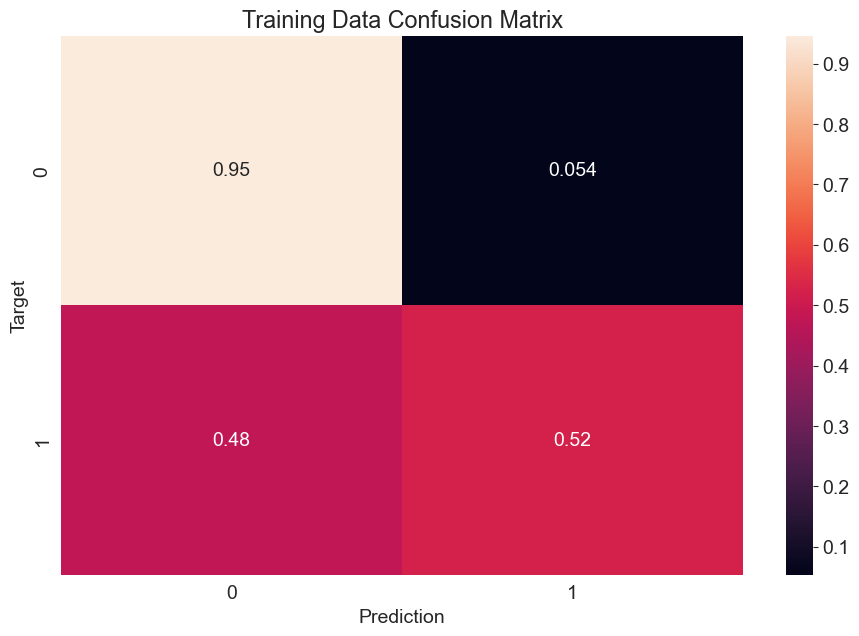

In [183]:
train_pred = predictAndPlot(X_train, train_target, "Training Data")

Accuracy: 85.41


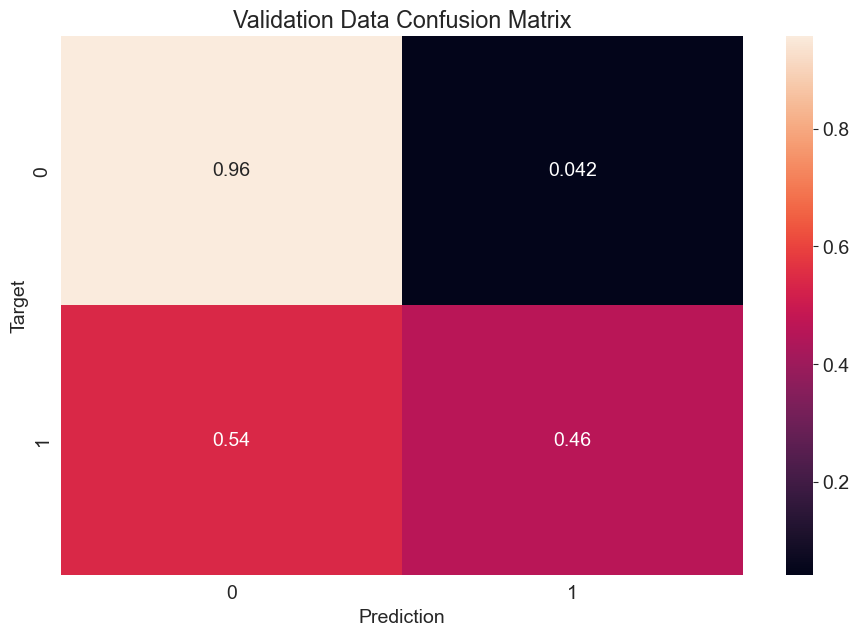

In [185]:
#Now let create the prediction for our validation:
val_pred = predictAndPlot(X_val, val_target, "Validation Data")

Accuracy: 84.22


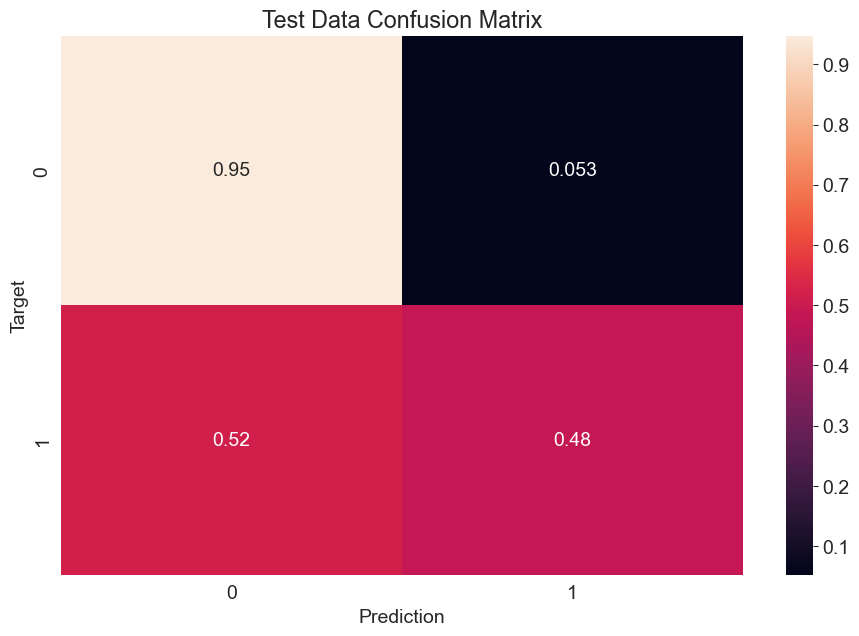

In [186]:
#Now let create the prediction for our test set:
test_pred = predictAndPlot(X_test, test_target, "Test Data")

In [ ]:
#Method for predicting single inputs
def predictSingleInputs(singleInputs):
    df = pd.DataFrame(singleInputs)
    df[numeric_cols] = imputer.transform(df[numeric_cols])
    df[numeric_cols] = scaler.transform(df[numeric_cols])
    df[encoded_cols] = encoder.transform(df[encoded_cols])
    X_input = df[numeric_cols+encoded_cols]
    pred = model.predict(X_input)[0]
    prob = model.predict.proba(X_input)[0]
    return pred, prob
    